In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path
import pandas as pd
from matplotlib import pyplot as plt
from collections import OrderedDict
from IPython import display

from metrics import (combine_mean, make_df, subset_df,
                     get_best_epochs_table_all)
from vis_utils.metrics import (plot_scatter_best_epochs, plot_runs,
                               plot_analysis)

In [3]:
def show_header(title, level=4, center=False):
    if center:
        title = f'<center>{title}</center>'
    display.display(display.HTML(f'<h{level}>{title}</h{level}>'))

## Corpus

In [4]:
MODEL_ROOT = Path('models/')
corpora = OrderedDict([
    ('wik6', {
        'name': 'EnWik6',
        'files': [str(path) for path in MODEL_ROOT.glob('./enwik6.v4_*/metrics.csv')],
        'size':  1e5
    }),
    ('wik7', {
        'name': 'EnWik7',
        'files': [str(path) for path in MODEL_ROOT.glob('./enwik7.v4_*/metrics.csv')],
        'size':  1e6
    }),
    ('wik8', {
        'name': 'EnWik8',
        'files': ['models/enwik8.v4_1/metrics.csv'],
        'size':  1e7
    }),
    ('wik9', {
        'name': 'EnWik9',
        'files': ['models/enwik9.v5_1/metrics.csv'],
        'size':  1e8
    })
])

In [5]:
images_root = Path('./images/metrics_min_alpha/')
!mkdir -p {images_root}

In [6]:
corpus_size = pd.Series({corpus: corpus_config['size'] for corpus, corpus_config in corpora.items()})


In [7]:
dfs_all = {}
dfs = {}
for name, corpus_config in corpora.items():
    dfs_all[name] = OrderedDict()
    for i, path in enumerate(corpus_config['files']):
        df = pd.read_csv(path)
        df.index.name = 'epoch' 
        dfs_all[name][str(i+1)] = df 
    dfs[name] = combine_mean(dfs_all[name].values())

In [8]:
dfs['wik6'].avg.columns

Index(['iter', 'epoch', 'alpha', 'loss', 'loss_p', 'loss_n', 'dist_emb_mean',
       'dist_emb_std', 'dist_ctx_mean', 'dist_ctx_std', 'corr_ws', 'corr_rw',
       'corr_men', 'corr_mturk', 'corr_simlex', 'score_battig', 'wa_acc',
       'exp_rw_freq-1', 'exp_rw_freq-2', 'exp_rw_freq-3', 'exp_rw_freq-5',
       'exp_ws_freq-1', 'exp_ws_freq-2', 'exp_ws_freq-3', 'exp_ws_freq-4',
       'exp_ws_freq-5', 'exp_ws_freq-10', 'exp_men_freq-1', 'exp_men_freq-2',
       'exp_men_freq-3', 'exp_men_freq-4', 'exp_men_freq-5', 'exp_men_freq-10',
       'exp_mturk_freq-1', 'exp_mturk_freq-2', 'exp_mturk_freq-3',
       'exp_mturk_freq-4', 'exp_mturk_freq-5', 'exp_mturk_freq-10',
       'exp_simlex_freq-1', 'exp_simlex_freq-2', 'exp_simlex_freq-3',
       'exp_simlex_freq-4', 'exp_simlex_freq-5', 'exp_simlex_freq-10',
       'exp_battig_freq-1', 'exp_battig_freq-2', 'exp_battig_freq-3',
       'exp_battig_freq-4', 'exp_battig_freq-5', 'exp_battig_freq-10',
       'lmh_rw_low', 'lmh_rw_mid', 'lmh_ws_lo

In [9]:
df_rw_global = make_df(dfs, 'corr_rw')
df_ws_global = make_df(dfs, 'corr_ws')
df_men_global = make_df(dfs, 'corr_men')
df_simlex_global = make_df(dfs, 'corr_simlex')
df_mturk_global = make_df(dfs, 'corr_mturk')
df_wa_global = make_df(dfs, 'wa_acc')
df_altszyler_global = make_df(dfs, 'score_battig')

df_rw_global_by_dataset = {ds_name: make_df(dfs_all[ds_name], 'corr_rw') for ds_name in dfs} 
df_ws_global_by_dataset = {ds_name: make_df(dfs_all[ds_name], 'corr_ws') for ds_name in dfs} 
df_wa_global_by_dataset = {ds_name: make_df(dfs_all[ds_name], 'wa_acc') for ds_name in dfs}
df_men_global_by_dataset = {ds_name: make_df(dfs_all[ds_name], 'corr_men') for ds_name in dfs}
df_simlex_global_by_dataset = {ds_name: make_df(dfs_all[ds_name], 'corr_simlex') for ds_name in dfs}
df_mturk_global_by_dataset = {ds_name: make_df(dfs_all[ds_name], 'corr_mturk') for ds_name in dfs}
df_altszyler_global_by_dataset = {ds_name: make_df(dfs_all[ds_name], 'score_battig') for ds_name in dfs}

freq_ws_by_dataset = {ds_name: subset_df(df, 'exp_ws_') for ds_name, df in dfs.items()}
freq_rw_by_dataset = {ds_name: subset_df(df, 'exp_rw_') for ds_name, df in dfs.items()}
freq_wa_by_dataset = {ds_name: subset_df(df, 'exp_wa_') for ds_name, df in dfs.items()}
freq_men_by_dataset = {ds_name: subset_df(df, 'exp_men_') for ds_name, df in dfs.items()}
freq_mturk_by_dataset = {ds_name: subset_df(df, 'exp_mturk_') for ds_name, df in dfs.items()}
freq_simlex_by_dataset = {ds_name: subset_df(df, 'exp_simlex_') for ds_name, df in dfs.items()}
freq_altszyler_by_dataset = {ds_name: subset_df(df, 'exp_battig_') for ds_name, df in dfs.items()}

lmh_ws_by_dataset = {ds_name: subset_df(df, 'lmh_ws_') for ds_name, df in dfs.items()}
lmh_rw_by_dataset = {ds_name: subset_df(df, 'lmh_rw_') for ds_name, df in dfs.items()}
lmh_wa_by_dataset = {ds_name: subset_df(df, 'lmh_wa_') for ds_name, df in dfs.items()}
lmh_men_by_dataset = {ds_name: subset_df(df, 'lmh_men_') for ds_name, df in dfs.items()}
lmh_mturk_by_dataset = {ds_name: subset_df(df, 'lmh_mturk_') for ds_name, df in dfs.items()}
lmh_simlex_by_dataset = {ds_name: subset_df(df, 'lmh_simlex_') for ds_name, df in dfs.items()}
lmh_altszyler_by_dataset = {ds_name: subset_df(df, 'lmh_battig_') for ds_name, df in dfs.items()}

In [10]:
df

,iter,epoch,alpha,loss,loss_p,loss_n,dist_emb_mean,dist_emb_std,dist_ctx_mean,dist_ctx_std,...,exp_wa_freq-5,exp_wa_freq-10,exp_wa_freq-50,exp_wa_freq-100,exp_wa_freq-500,exp_wa_freq-1K,exp_wa_freq-5K,exp_wa_freq-10K,lmh_wa_low,lmh_wa_mid
epoch,,,,,,,,,,,,,,,,,,,,,
0,1,1.0,0.025,33735732.0,26397388.0,12778946.0,0.640349,0.697021,0.539733,0.670516,...,0.000000,0.061762,0.089653,0.184875,0.239882,0.259042,0.399306,0.305263,0.000000,0.169845
1,2,2.0,0.025,17952132.0,19436884.0,5728694.0,0.792269,0.790915,0.773081,0.802928,...,0.000000,0.108702,0.132985,0.243048,0.295110,0.323884,0.357639,0.284211,0.000000,0.222332
2,3,3.0,0.025,15637880.0,16851536.0,3299840.0,0.925931,0.857447,0.975757,0.872436,...,0.000000,0.123525,0.146433,0.259932,0.290051,0.327794,0.399306,0.305263,0.000000,0.233886
3,4,4.0,0.025,1623336.0,5555352.0,3266938.0,1.055034,0.905391,1.156385,0.914173,...,0.000000,0.135328,0.143444,0.259506,0.333895,0.321929,0.406250,0.326316,0.000000,0.240207
4,5,5.0,0.025,1623432.0,1529064.0,3229002.0,1.179218,0.940165,1.320014,0.940482,...,0.000000,0.147131,0.156892,0.276958,0.316189,0.321603,0.430556,0.284211,0.008197,0.248601
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,296,296.0,0.025,0.0,0.0,107400.0,5.911146,1.347588,7.124435,1.529159,...,0.000000,0.169915,0.188644,0.292565,0.360877,0.354513,0.454861,0.347368,0.008197,0.274404
296,297,297.0,0.025,0.0,0.0,107424.0,5.916338,1.348441,7.130768,1.530516,...,0.005882,0.193247,0.173328,0.295119,0.354975,0.357445,0.437500,0.442105,0.008197,0.277617
297,298,298.0,0.025,0.0,0.0,106752.0,5.921552,1.349217,7.137114,1.531705,...,0.005882,0.187483,0.168846,0.298241,0.370152,0.363636,0.451389,0.452632,0.008197,0.280155


In [11]:
WINDOW=5

## Mejores Épocas Global

In [12]:
CMAP = plt.get_cmap('jet')
#CMAP_by_cat = {c: CMAP(i/(len(df_words.freq_class.unique())-1)) for i, c in enumerate(sorted(df_words.freq_class.unique()))}
#CMAP_list = list(map(lambda x: x[1], sorted(CMAP_by_cat.items())))

### Varios Thresholds

In [13]:
thresholds = [0.8, 0.85, 0.9, 0.95]
df_best_epochs = get_best_epochs_table_all({
    'Word-Sim': df_ws_global,
    'Rare-Word': df_rw_global,
    'Men': df_men_global,
    'Sim-Lex': df_simlex_global,
    'MTurk': df_mturk_global,
    'Word-Analogy': df_wa_global,
    'Altszyler': df_altszyler_global,
}, thresholds)
df_best_epochs

0.80                0.85                0.90                0.95  \
             wik6 wik7 wik8 wik9 wik6 wik7 wik8 wik9 wik6 wik7 wik8 wik9 wik6   
Word-Sim       16    6    3   27   18    7    3   27   22    9    3  144   41   
Rare-Word       4    2    2    2    5    3    3    2    7    4    3    2    8   
Men            22    8    4    6   24    9    5    9   29   10    5   15   35   
Sim-Lex         7    3    2   33    8    4    2   33    9    5    2   33    9   
MTurk          29    8    3   68   36    9    4   85   45   10    7  117   83   
Word-Analogy    6    3    4   16    6    3    4   24    6    3    5   70    6   
Altszyler      18   15    5    1   23   19    6    2   34   25    7    2   75   

                             
             wik7 wik8 wik9  
Word-Sim       15    7  169  
Rare-Word       5    3    3  
Men            13    7   28  
Sim-Lex         6    2  273  
MTurk          12    7  117  
Word-Analogy    3    9  189  
Altszyler      33    8    2

In [14]:
df_best_epochs[0.8]

,wik6,wik7,wik8,wik9
Word-Sim,16,6,3,27
Rare-Word,4,2,2,2
Men,22,8,4,6
Sim-Lex,7,3,2,33
MTurk,29,8,3,68
Word-Analogy,6,3,4,16
Altszyler,18,15,5,1


In [15]:
pd.DataFrame({
    th: df_best_epochs[th].median(axis=0)
    for th in thresholds
}).astype(int)

,0.80,0.85,0.90,0.95
wik6,16,18,22,35
wik7,6,7,9,12
wik8,3,4,5,7
wik9,16,24,33,117


In [16]:
df_best_epochs_order = pd.concat({
    level: df_best_epochs[level].apply(lambda s: s.argsort(), axis=1)
    for level in thresholds}, axis=1
)
df_best_epochs_order

0.80                0.85                0.90                0.95  \
             wik6 wik7 wik8 wik9 wik6 wik7 wik8 wik9 wik6 wik7 wik8 wik9 wik6   
Word-Sim        2    1    0    3    2    1    0    3    2    1    0    3    2   
Rare-Word       1    2    3    0    3    1    2    0    3    2    1    0    2   
Men             2    3    1    0    2    1    3    0    2    1    3    0    2   
Sim-Lex         2    1    0    3    2    1    0    3    2    1    0    3    2   
MTurk           2    1    0    3    2    1    0    3    2    1    0    3    2   
Word-Analogy    1    2    0    3    1    2    0    3    1    2    0    3    1   
Altszyler       3    2    1    0    3    2    1    0    3    2    1    0    3   

                             
             wik7 wik8 wik9  
Word-Sim        1    0    3  
Rare-Word       3    1    0  
Men             1    3    0  
Sim-Lex         1    0    3  
MTurk           1    0    3  
Word-Analogy    0    2    3  
Altszyler       2    1    0

In [17]:
df_best_epochs_order[0.8]

,wik6,wik7,wik8,wik9
Word-Sim,2,1,0,3
Rare-Word,1,2,3,0
Men,2,3,1,0
Sim-Lex,2,1,0,3
MTurk,2,1,0,3
Word-Analogy,1,2,0,3
Altszyler,3,2,1,0


### wik6 > wik7 > wik8

In [18]:
pd.concat({
    level: df_best_epochs[level].apply(lambda x: x.is_monotonic_decreasing, axis=1)
    for level in thresholds}, axis=1
).astype(int)

,0.80,0.85,0.90,0.95
Word-Sim,0,0,0,0
Rare-Word,1,1,1,1
Men,0,0,0,0
Sim-Lex,0,0,0,0
MTurk,0,0,0,0
Word-Analogy,0,0,0,0
Altszyler,1,1,1,1


### Scatter |Corpus| vs |iteraciones|

In [19]:
from utils import format_big_number
from functools import partial
scales = OrderedDict([
    ('×10⁹', 1e9),
    ('×10⁶', 1e6),
    ('×10³', 1e3),
])


tmp = (df_best_epochs[0.8] * corpus_size).style.format('{:.1e}')
#tmp = (df_best_epochs[0.8] * corpus_size).applymap(format_big_number)
tmp.to_excel(images_root/'best_epoch.xlsx')
display.display(tmp)

,wik6,wik7,wik8,wik9
Word-Sim,1.6e+06,6.0e+06,3.0e+07,2.7e+09
Rare-Word,4.0e+05,2.0e+06,2.0e+07,2.0e+08
Men,2.2e+06,8.0e+06,4.0e+07,6.0e+08
Sim-Lex,7.0e+05,3.0e+06,2.0e+07,3.3e+09
MTurk,2.9e+06,8.0e+06,3.0e+07,6.8e+09
Word-Analogy,6.0e+05,3.0e+06,4.0e+07,1.6e+09
Altszyler,1.8e+06,1.5e+07,5.0e+07,1.0e+08


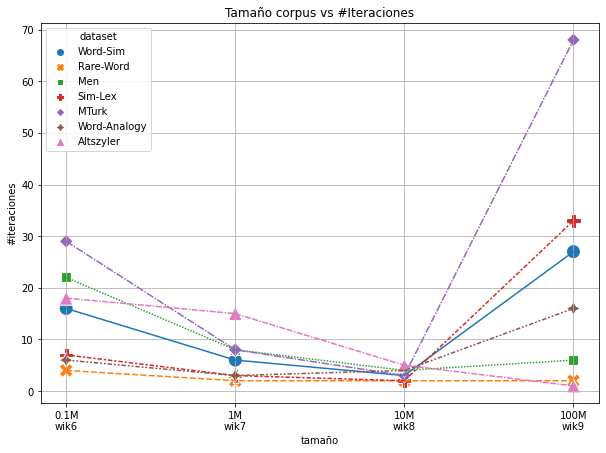

In [20]:
fig, ax = plt.subplots(figsize=(10, 7), sharey=True)
plot_scatter_best_epochs(ax, df_best_epochs[.8])
plt.savefig(images_root / "iteraciones-vs-corpus.png")
plt.show()

### Scatter |Corpus| vs |Iteraciones|

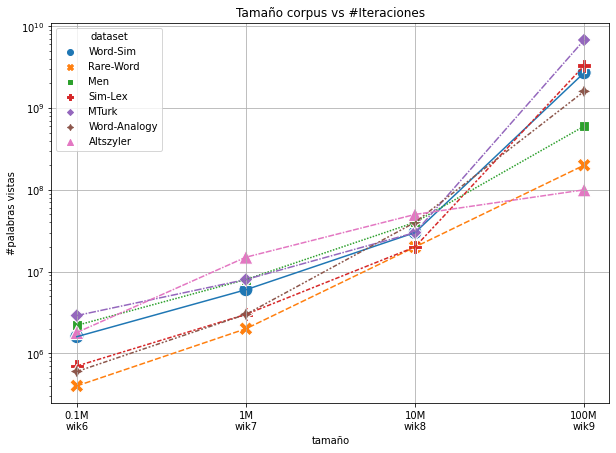

In [21]:
fig, ax = plt.subplots(figsize=(10, 7), sharey=True)
plot_scatter_best_epochs(ax, df_best_epochs[.8], corpus_size=corpus_size)
plt.savefig(images_root / "iteraciones-vs-corpus-exp.png")
plt.show()

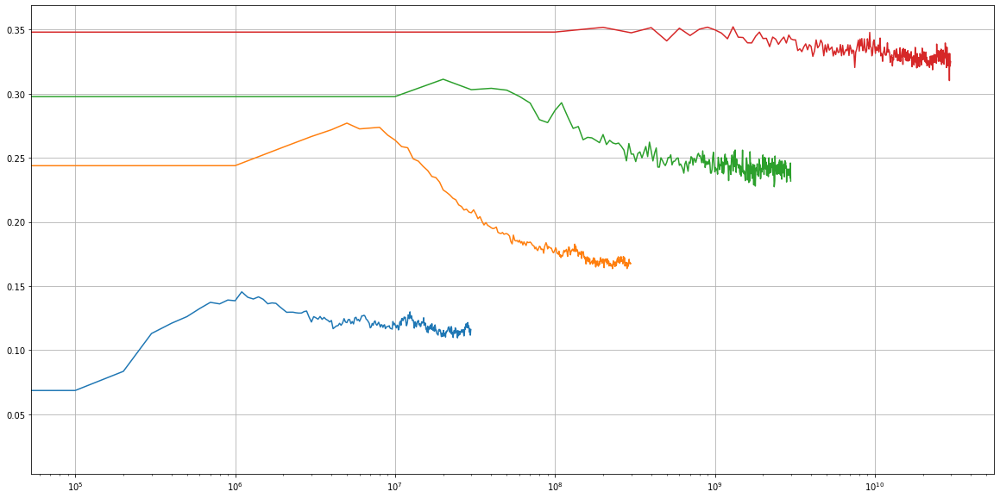

In [22]:
plt.figure(figsize=(20, 10))
for col in df_rw_global.avg.columns:
    x = (df_rw_global.avg[col].index[1:]-1) * corpus_size[col]
    y = df_rw_global.avg[col].values[1:]
    plt.plot(x, y, label=col)
plt.xscale('log')
plt.grid()

## Analisis Por Corridas

### WordSim

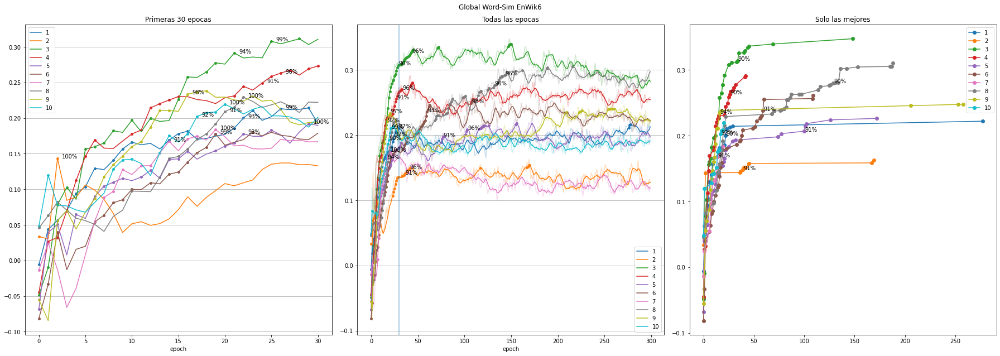

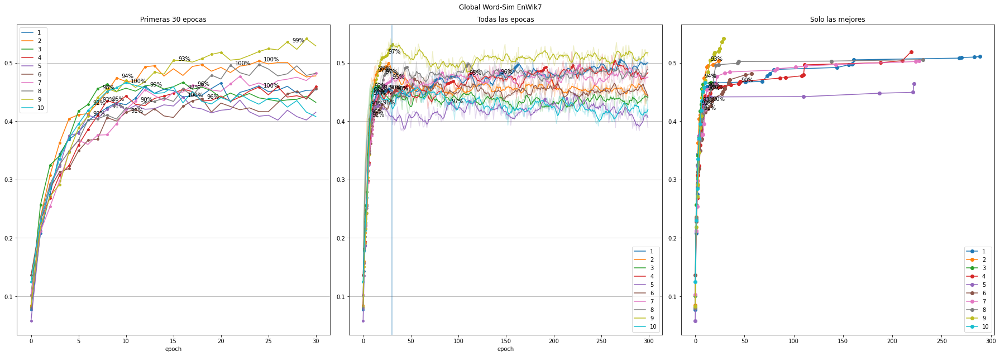

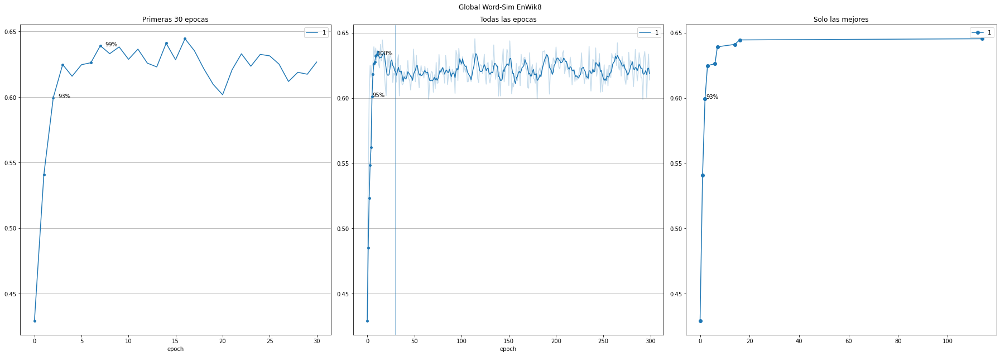

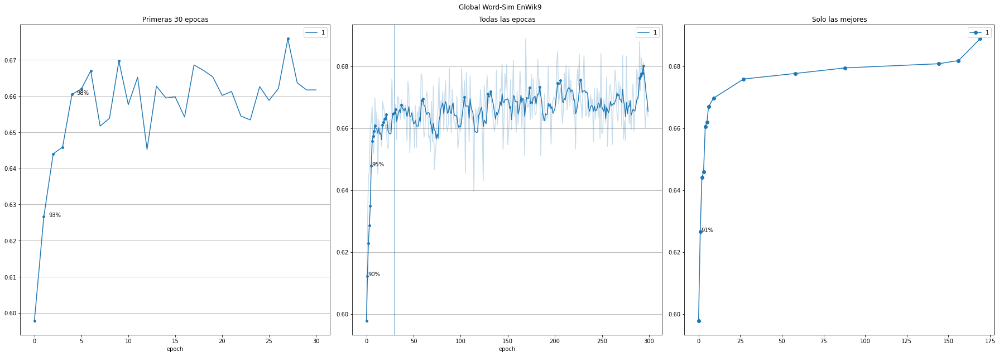

In [23]:
plot_runs(corpora, df_ws_global_by_dataset, "Word-Sim")

### Rare-Word

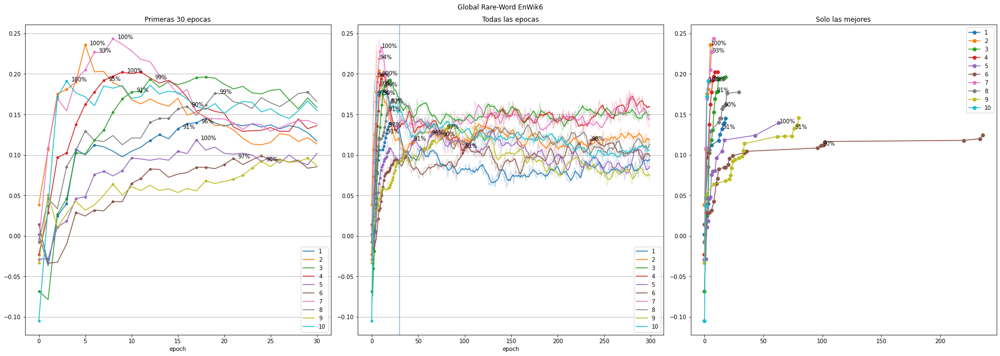

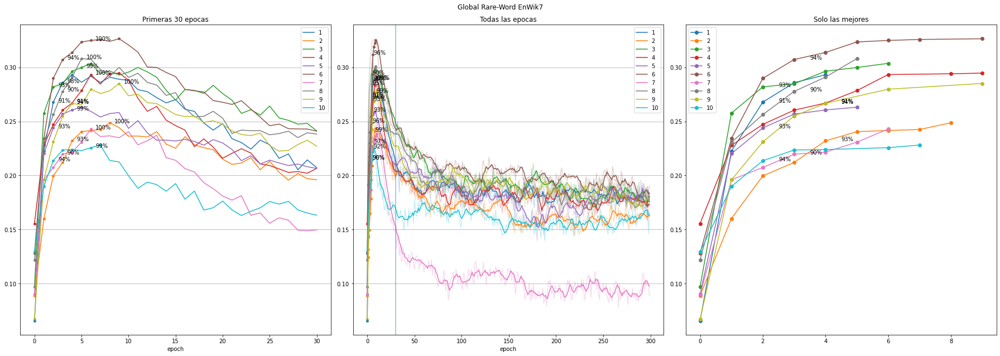

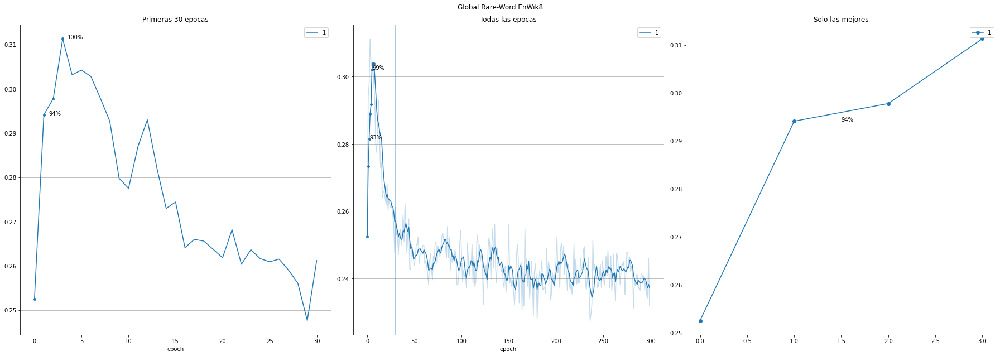

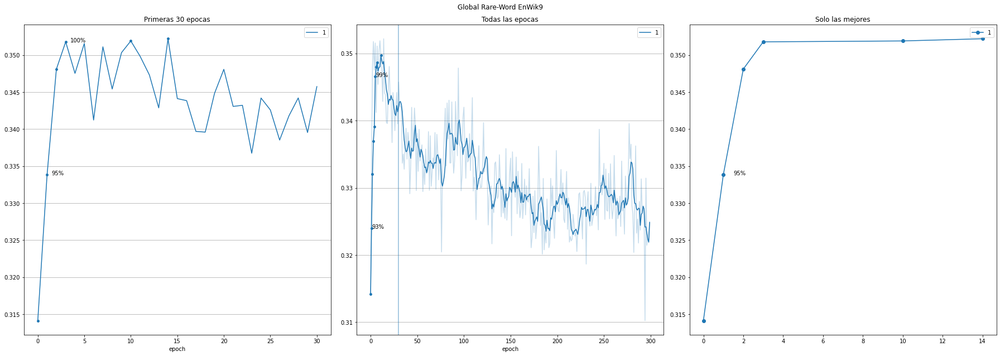

In [24]:
plot_runs(corpora, df_rw_global_by_dataset, "Rare-Word")

### Men

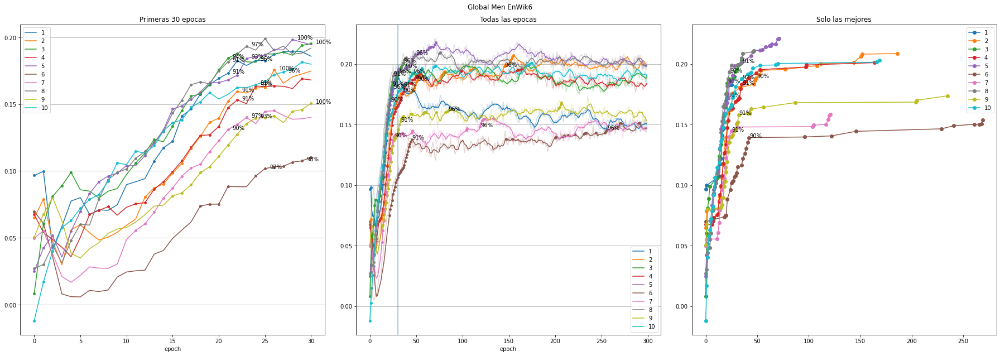

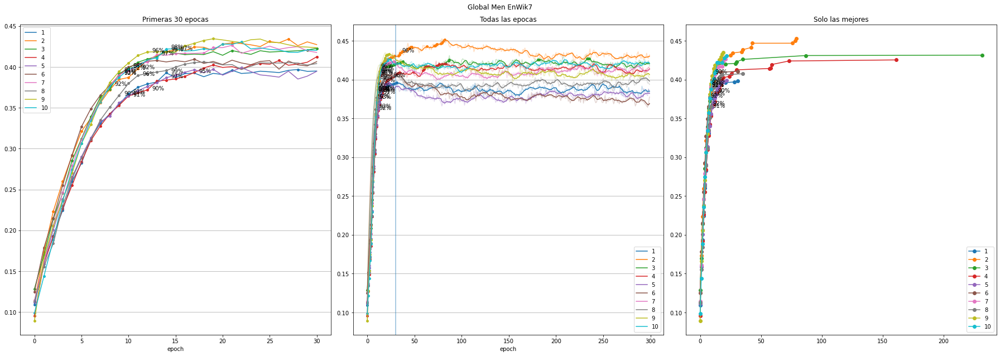

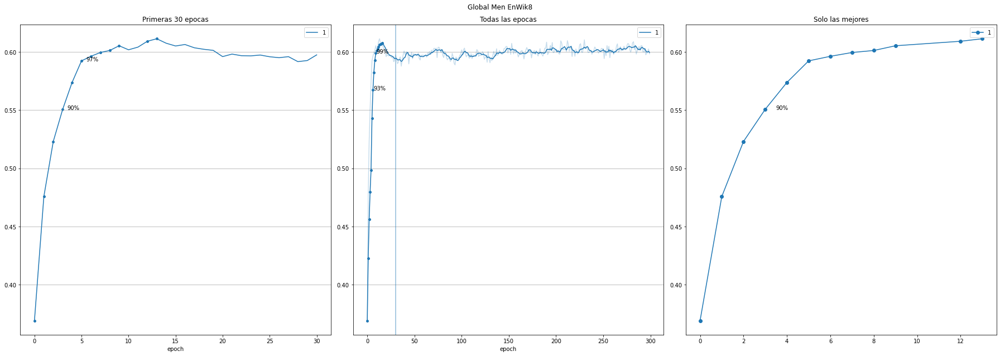

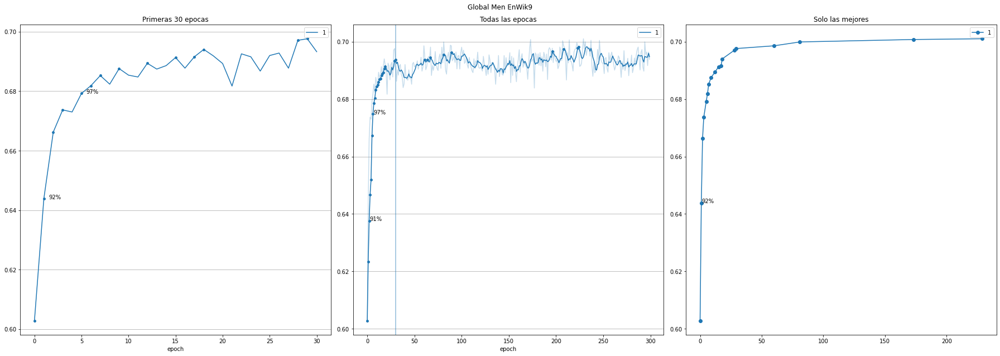

In [25]:
plot_runs(corpora, df_men_global_by_dataset, "Men")

### Sim-Lex

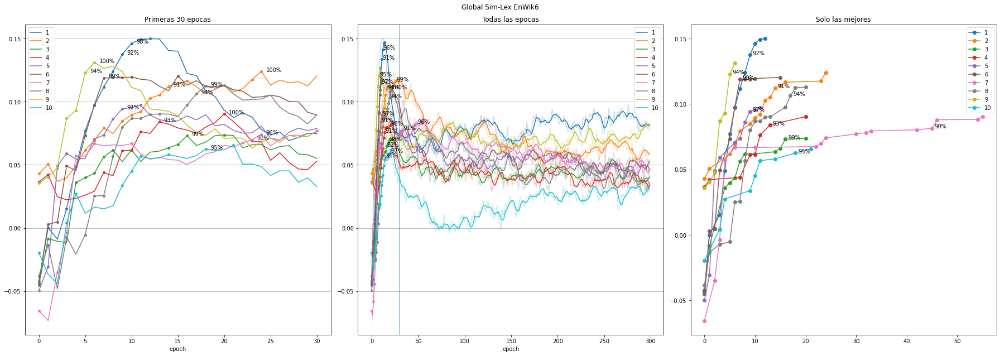

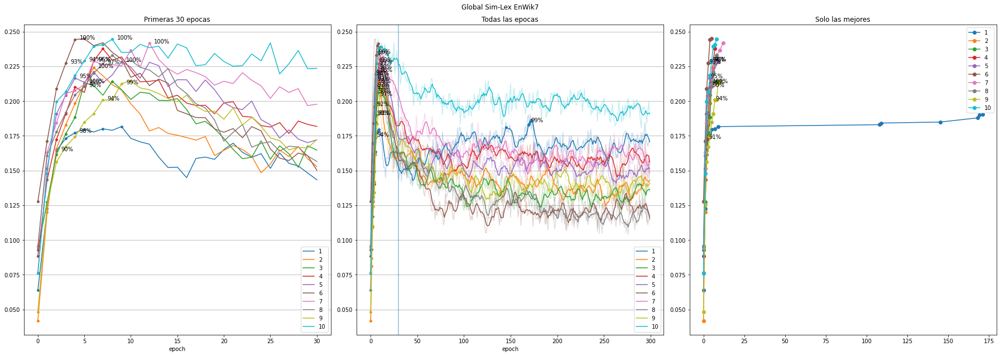

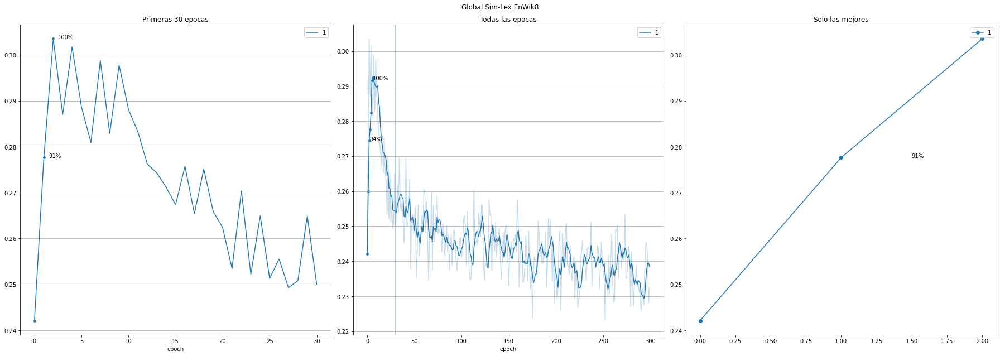

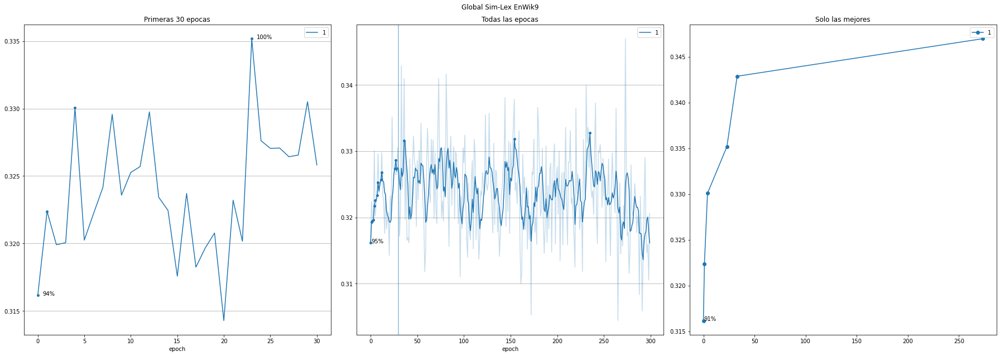

In [26]:
plot_runs(corpora, df_simlex_global_by_dataset, "Sim-Lex")

### MTurk

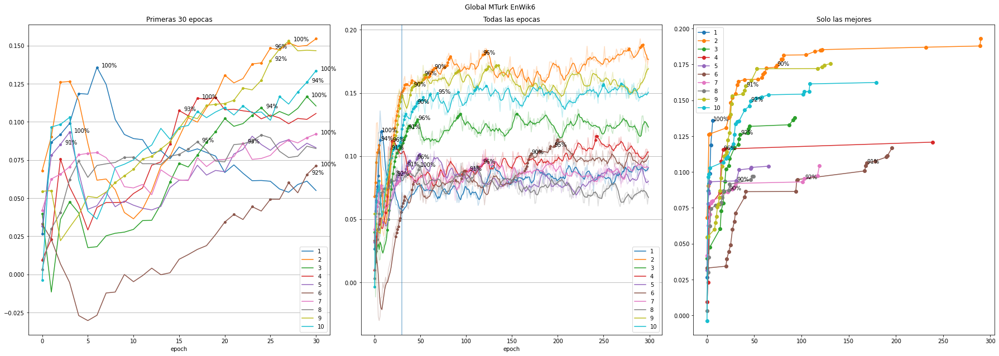

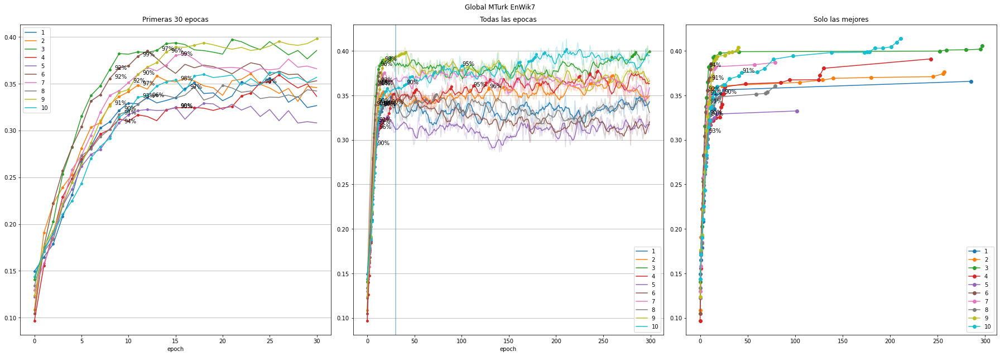

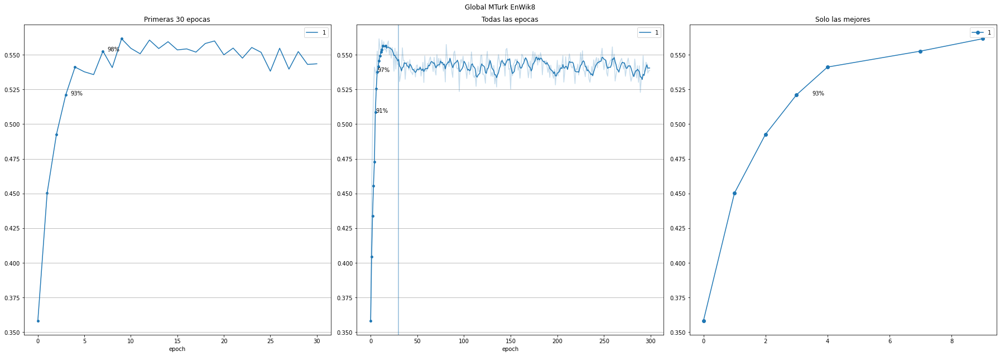

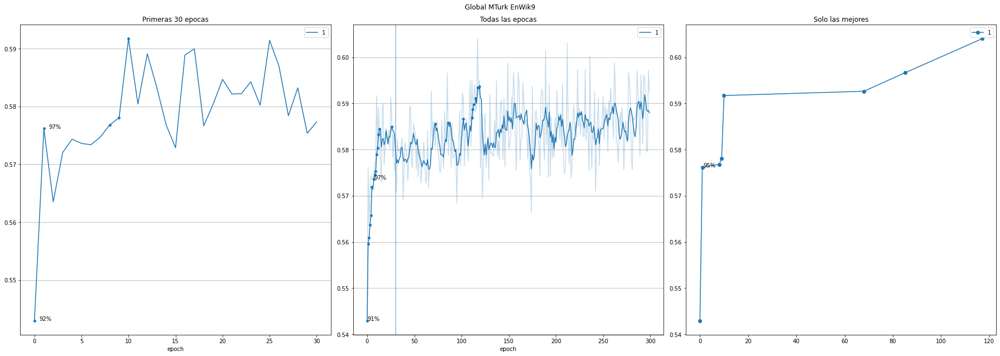

In [27]:
plot_runs(corpora, df_mturk_global_by_dataset, "MTurk")

### Altszyler

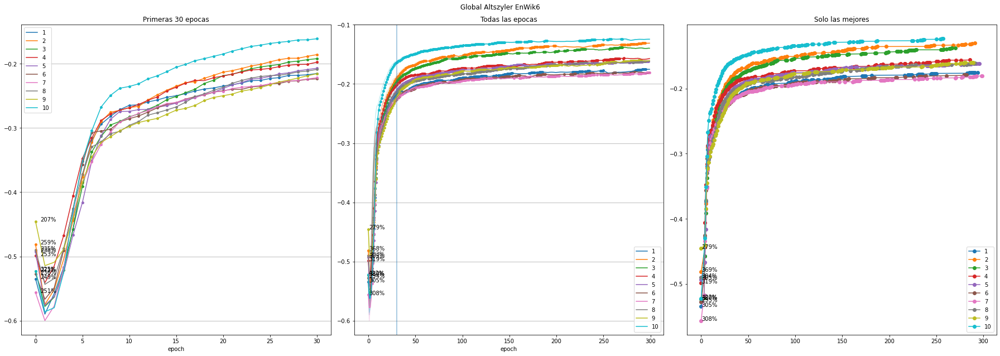

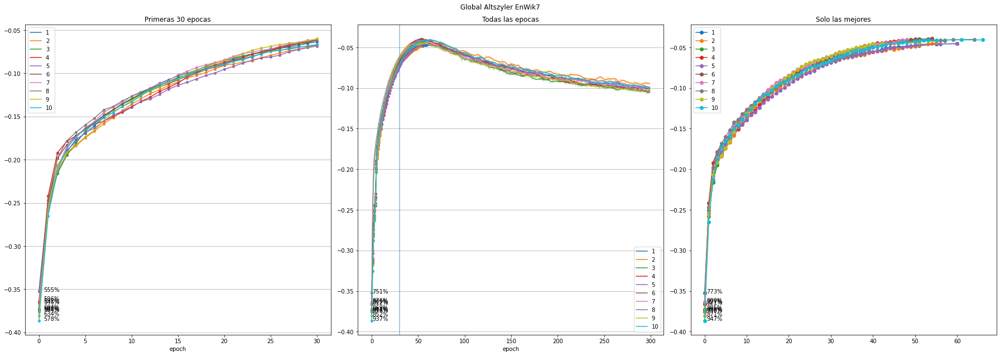

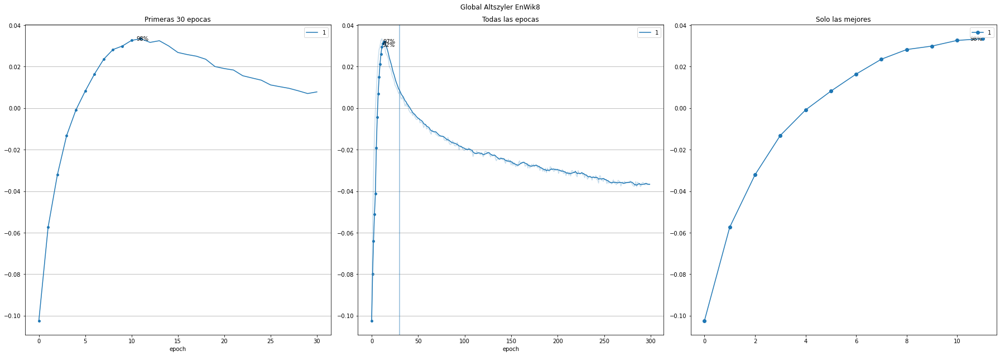

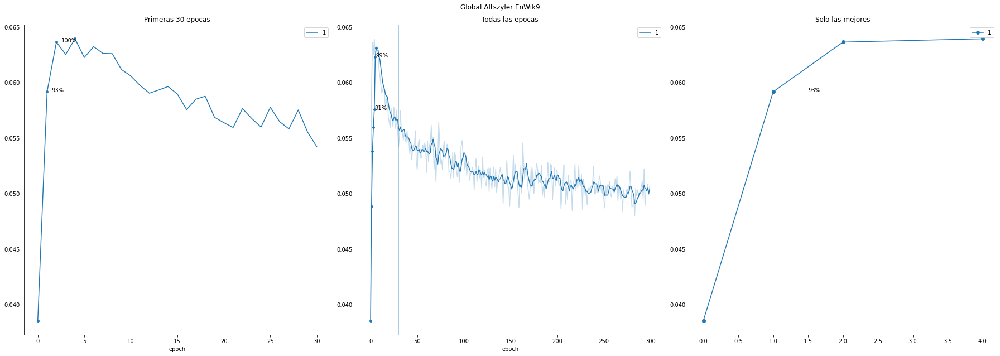

In [28]:
plot_runs(corpora, df_altszyler_global_by_dataset, "Altszyler")

## Global
<hr/>

Definicion:

* **Optimo**: Época con mejor valor
* **Casi optimo**: Primer época donde se consigue el 95% del máximo
* **Sub-optimo**: Época donde se consigue el 90% del máximo

### Word-Sim

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


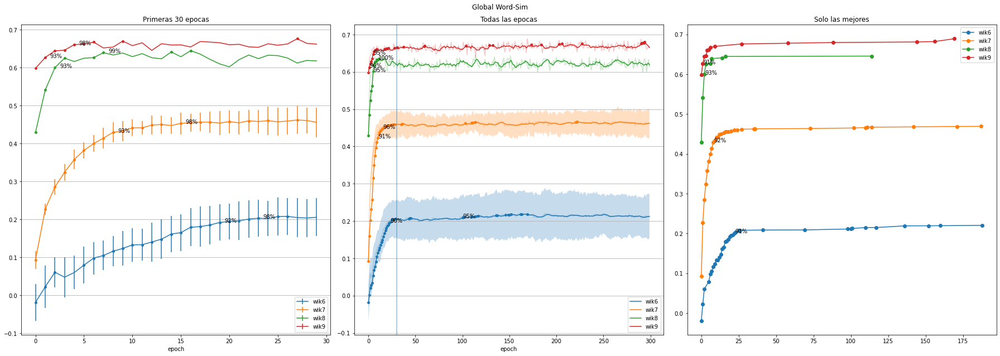

In [29]:
plot_analysis(df_ws_global, 'Global Word-Sim'); plt.savefig(images_root/'ws-global.png'); plt.show()

### Rare-Word

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


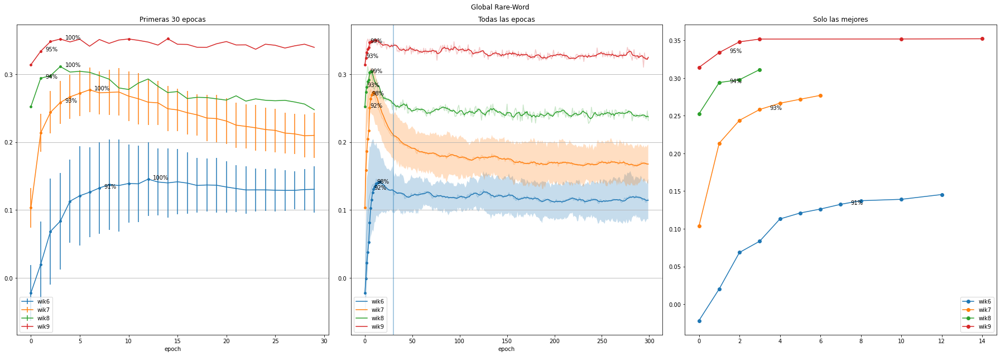

In [30]:
plot_analysis(df_rw_global, 'Global Rare-Word'); plt.savefig(images_root/'rw-global.png'); plt.show()

### Men

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


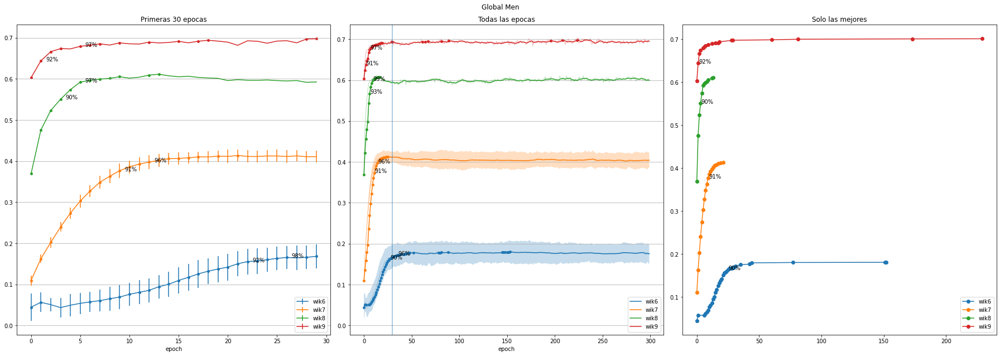

In [31]:
plot_analysis(df_men_global, 'Global Men'); plt.savefig(images_root/'men-global.png'); plt.show()

### Simlex

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


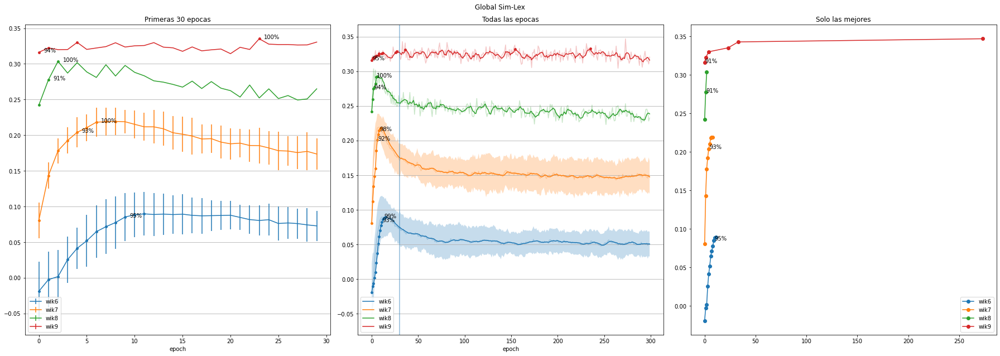

In [32]:
plot_analysis(df_simlex_global, 'Global Sim-Lex'); plt.savefig(images_root/'simlex-global.png'); plt.show()

### MTurk

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


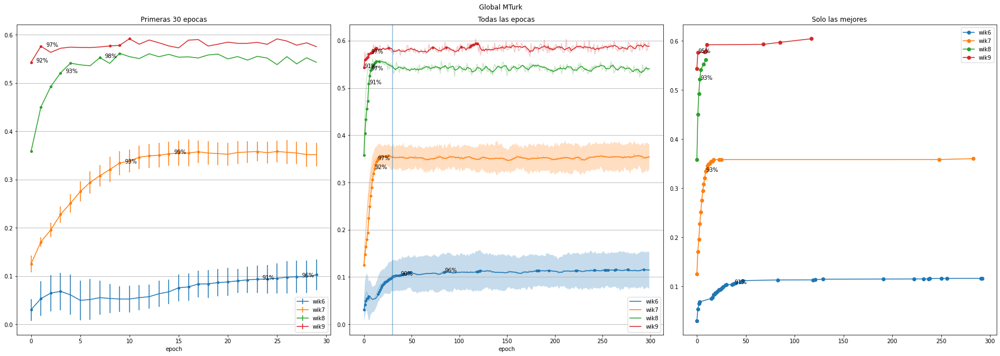

In [33]:
plot_analysis(df_mturk_global, 'Global MTurk'); plt.savefig(images_root/'mturk-global.png'); plt.show()

### Word-Analogy

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


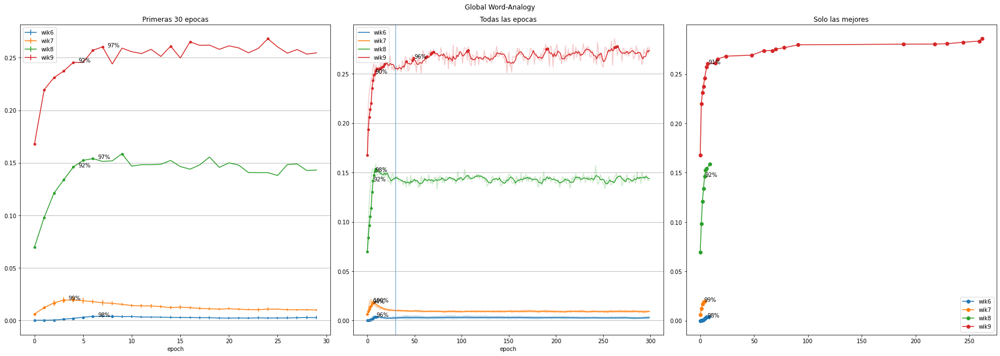

In [34]:
plot_analysis(df_wa_global, 'Global Word-Analogy'); plt.savefig(images_root/'wa-global.png'); plt.show()

### Altszyler

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


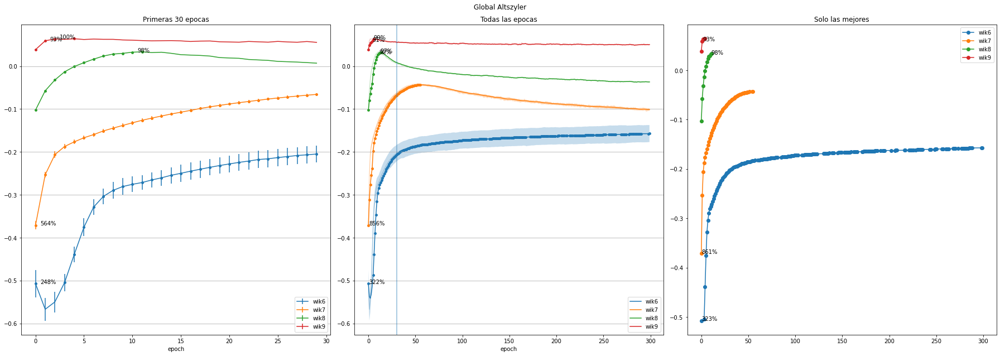

In [35]:
plot_analysis(df_altszyler_global, 'Global Altszyler'); plt.savefig(images_root/'altszyler-global.png'); plt.show()

## Por Dataset

### Mejores epócas

In [36]:
with pd.ExcelWriter(images_root/'freq_metrics.xlsx') as writer:
    for corpus, corpus_config in corpora.items():
        print(corpus)
        with pd.option_context('display.max_columns', None):
            tmp = get_best_epochs_table_all({
                    'Rare-Word': freq_rw_by_dataset[corpus],
                    'Word-Sim': freq_ws_by_dataset[corpus],
                    'Men': freq_men_by_dataset[corpus],
                    'Sim-Lex': freq_simlex_by_dataset[corpus],
                    'MTurk': freq_mturk_by_dataset[corpus],
                    'Word-Analogy': freq_wa_by_dataset[corpus],
                    'Altszyler': freq_altszyler_by_dataset[corpus],
                }, [0.8])[0.8]
            tmp = tmp.applymap(lambda x: '' if x!=x else format_big_number(x))
            tmp.to_excel(writer, sheet_name=corpus)
            display.display(tmp)

wik6


,freq-1,freq-2,freq-3,freq-4,freq-5,freq-10
Rare-Word,6,0,14,5,2,
Word-Sim,16,14,19,26,19,14
Men,30,17,19,14,16,13
Sim-Lex,3,10,10,9,15,1
MTurk,3,45,29,18,8,15
Word-Analogy,37,13,11,6,6,5
Altszyler,29,20,23,21,14,8


wik7


,freq-1,freq-2,freq-3,freq-4,freq-5,freq-10,freq-50,freq-100
Rare-Word,1,1,2,1,3,6,3,
Word-Sim,1,30,3,50,36,7,10,4
Men,2,5,8,11,7,5,4,3
Sim-Lex,2,3,3,6,6,3,2,4
MTurk,1,4,10,14,9,6,7,4
Word-Analogy,77,3,2,4,4,3,3,2
Altszyler,22,11,13,10,7,4,2,2


wik8


,freq-1,freq-2,freq-3,freq-4,freq-5,freq-10,freq-50,freq-100,freq-500,freq-1K
Rare-Word,1,72,2,0,80,4,1,4,18,
Word-Sim,,,,,,2,2,14,3,5
Men,2,61,5,1,68,5,4,4,7,48
Sim-Lex,,,,,30,1,4,2,18,11
MTurk,,,,,1,9,4,7,7,4
Word-Analogy,268,3,36,24,5,4,5,4,7,5
Altszyler,,,,,81,3,5,2,0,0


wik9


,freq-1,freq-2,freq-3,freq-4,freq-5,freq-10,freq-50,freq-100,freq-500,freq-1K,freq-5K,freq-10K
Rare-Word,1,0,3,1,0,10,45,20,24,14,,
Word-Sim,,,,,,,,18,69,24,6,113
Men,,,,,,29,12,9,18,17,48,23
Sim-Lex,,,,,,123,3,5,16,23,17,1
MTurk,,,,,,,21,11,25,10,34,0
Word-Analogy,,,128,74,226,17,6,7,16,41,131,89
Altszyler,,,,,,7,0,1,39,1,0,1


### Por frecuencias

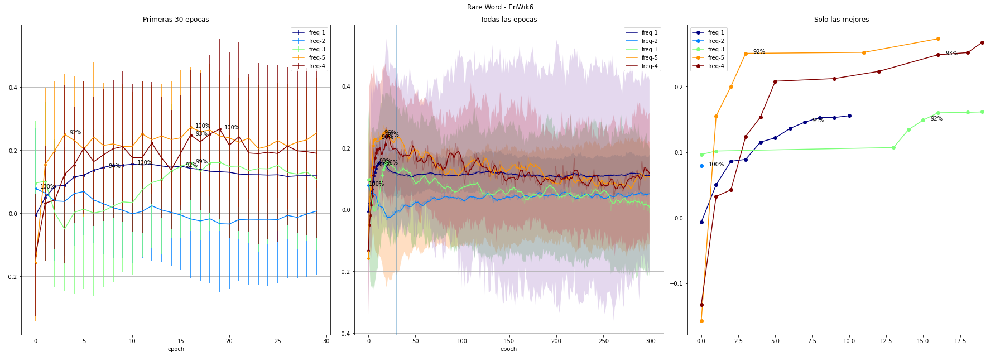

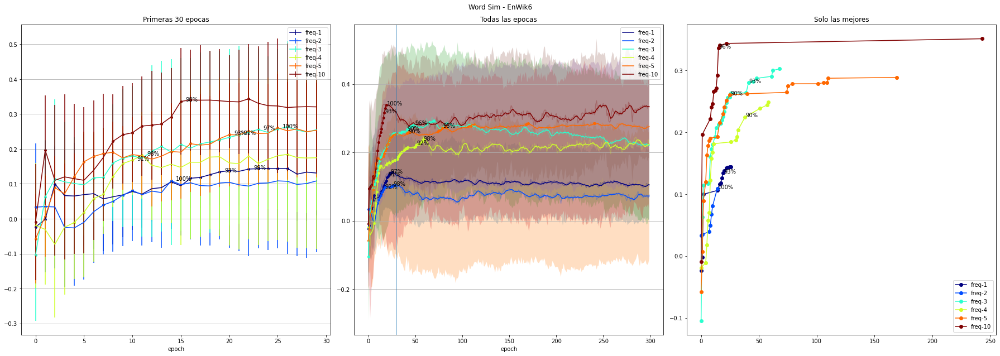

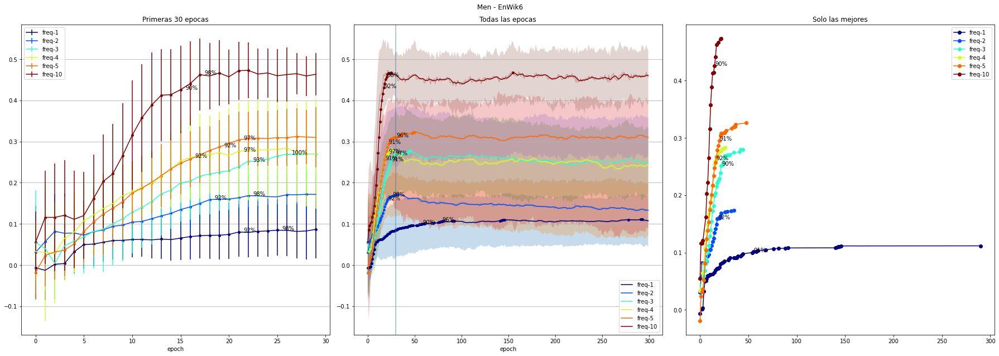

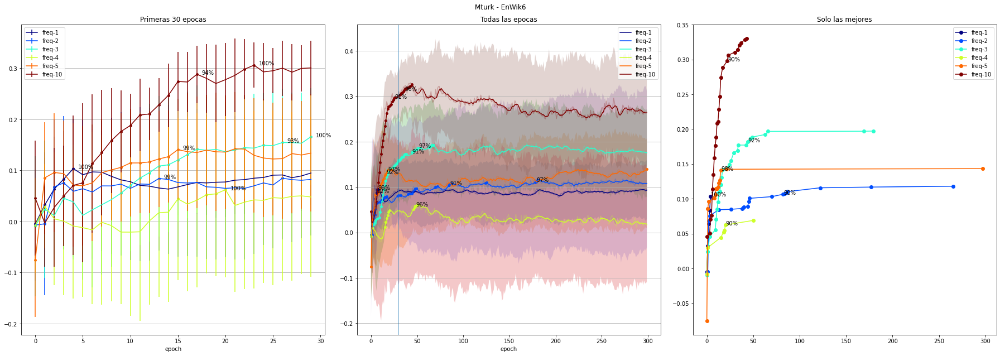

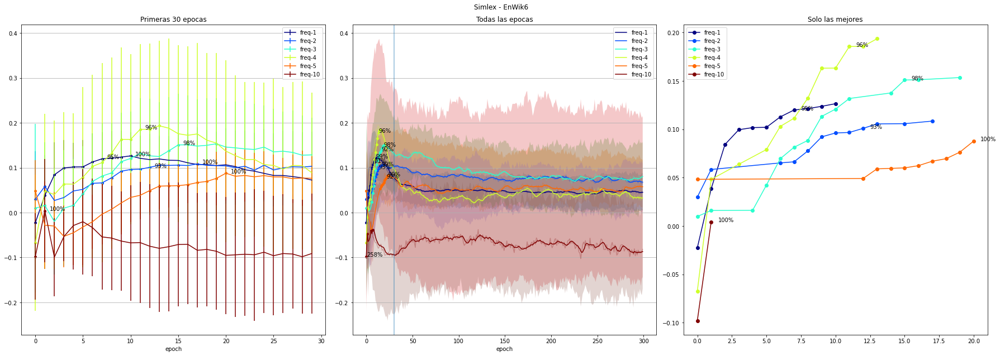

...

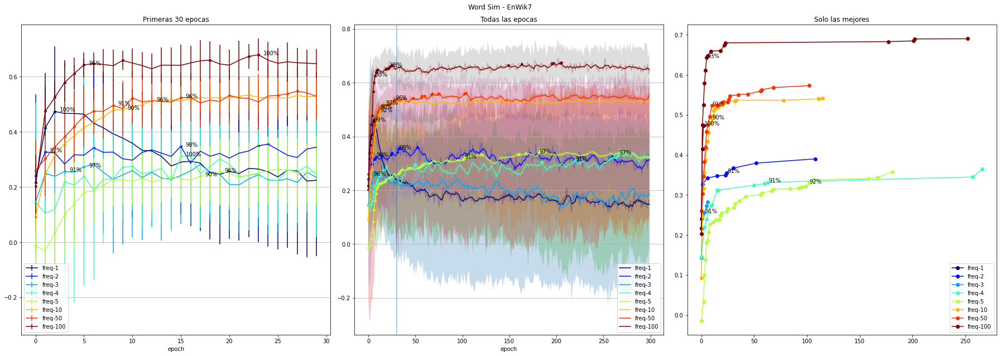

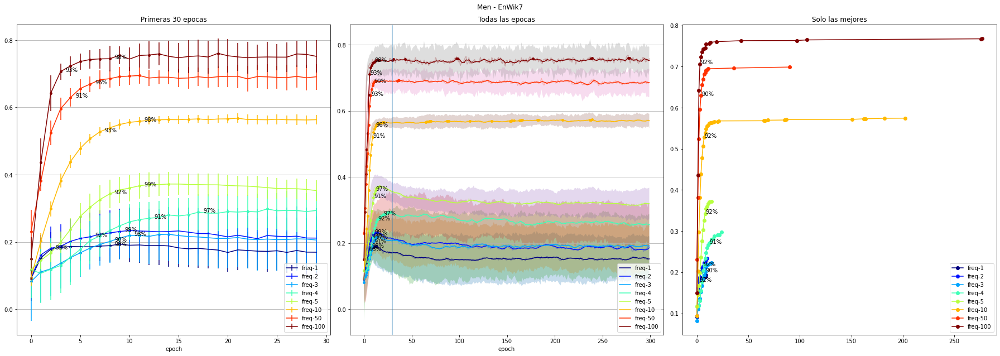

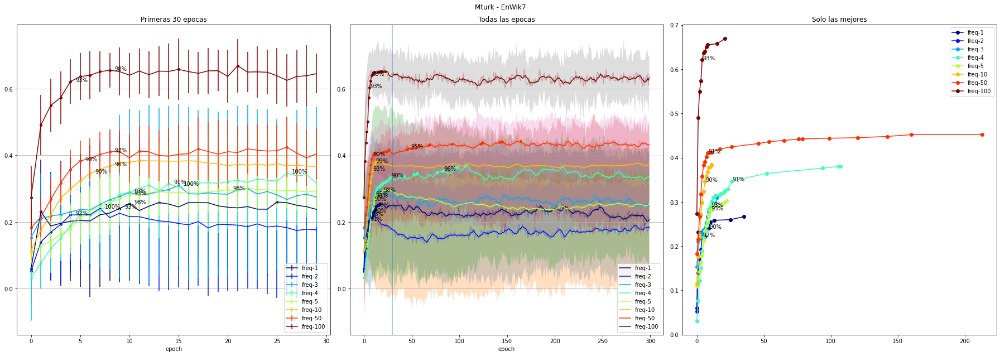

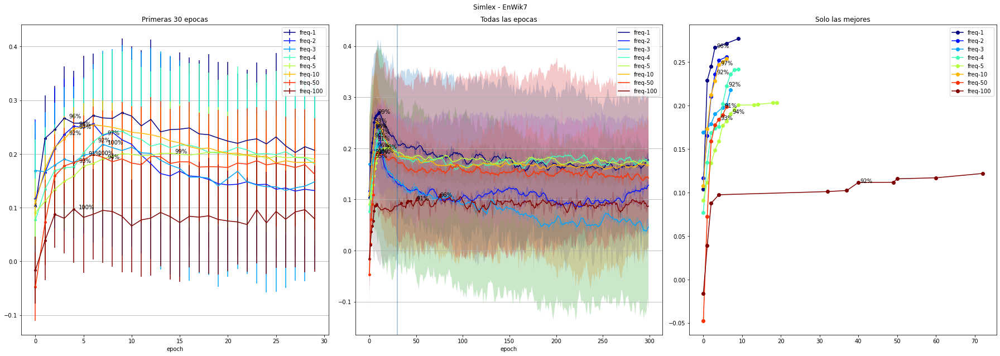

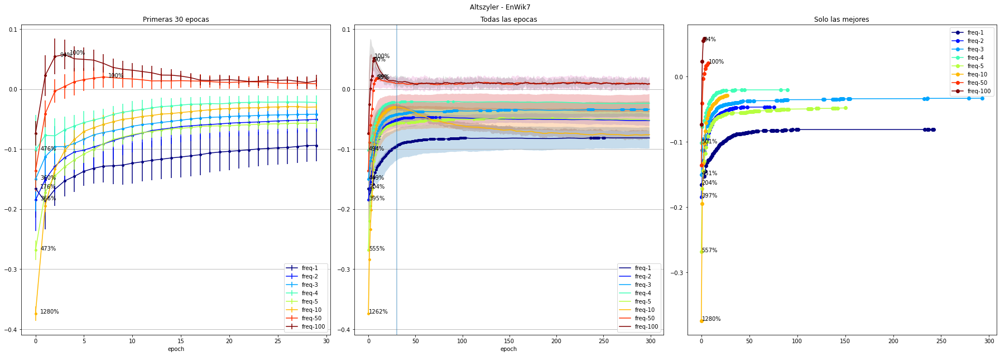

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  

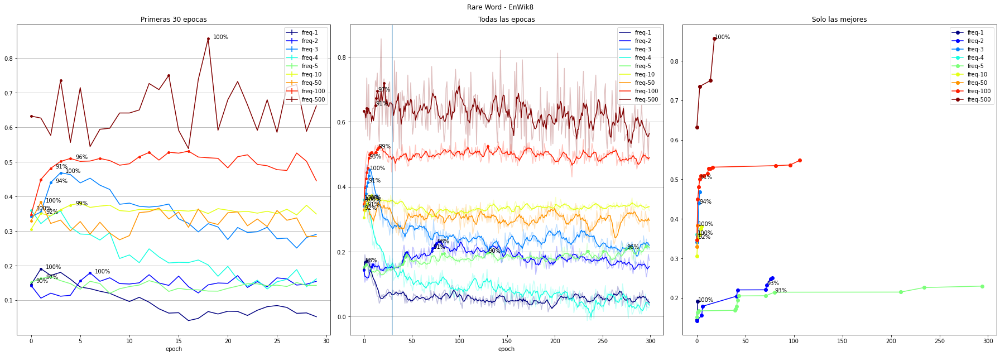

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


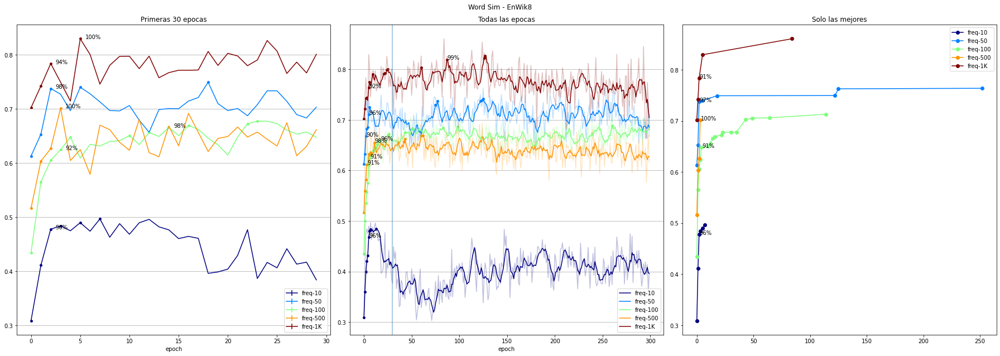

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  

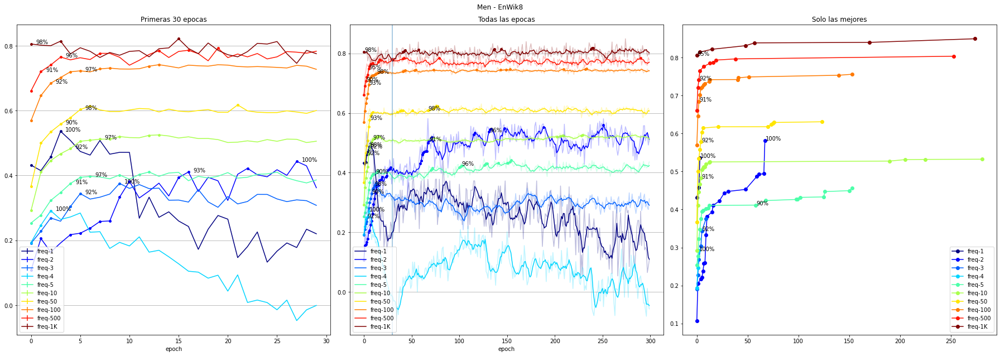

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


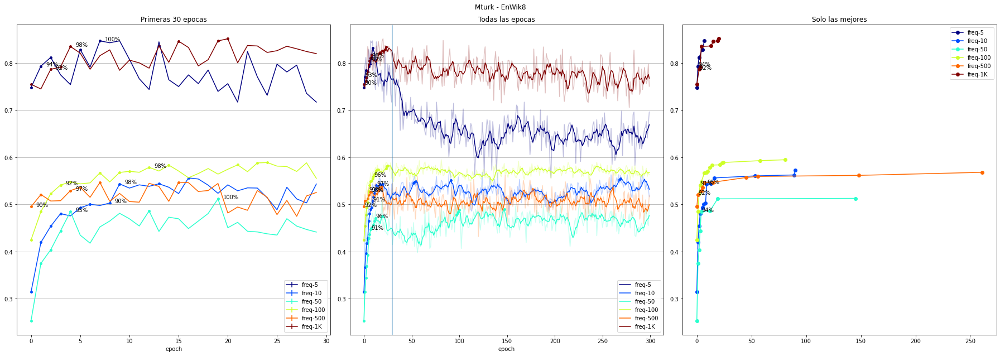

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


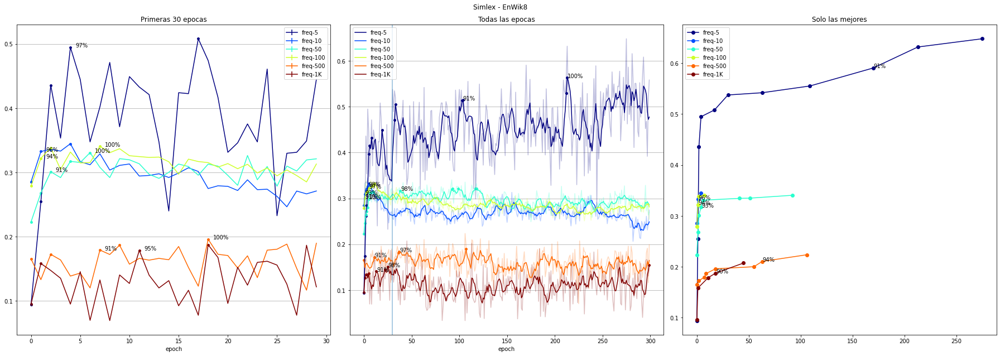

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


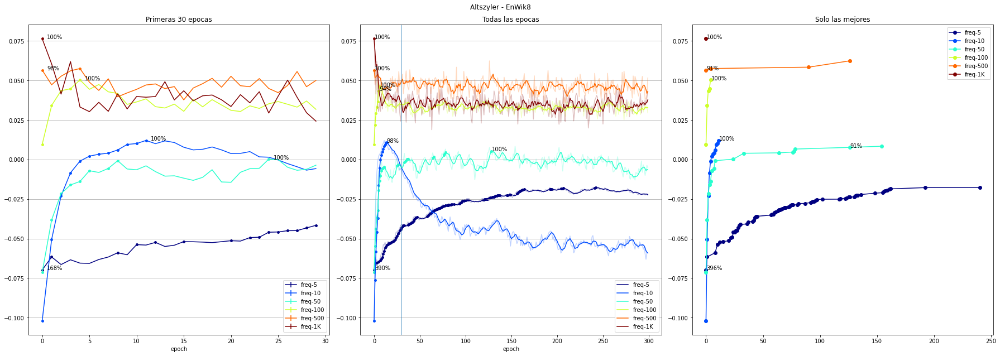

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  

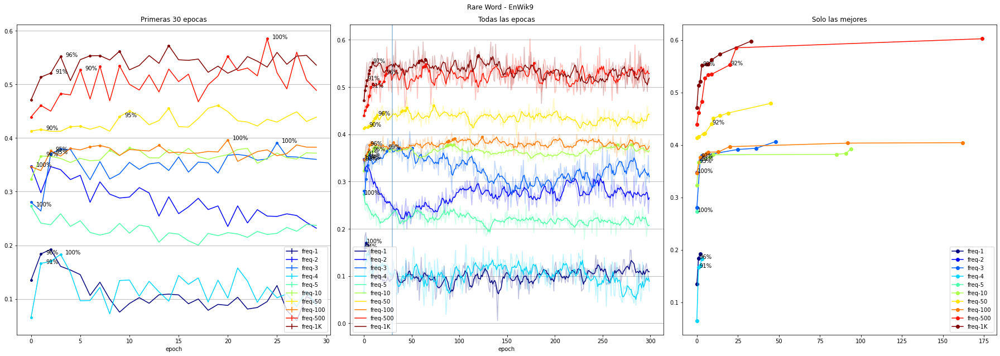

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


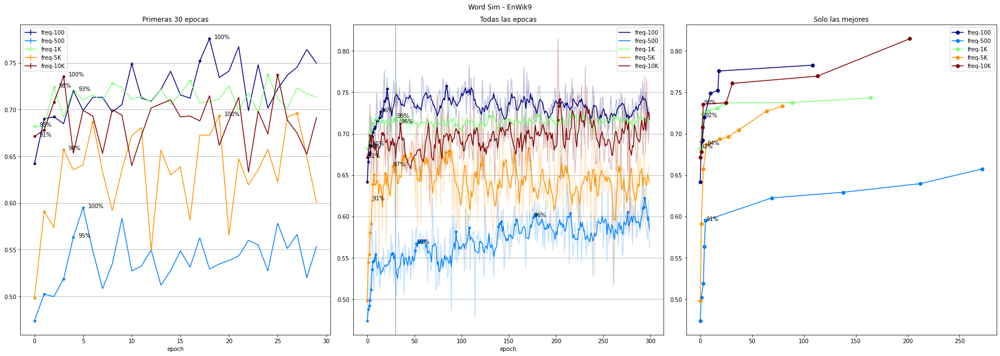

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  

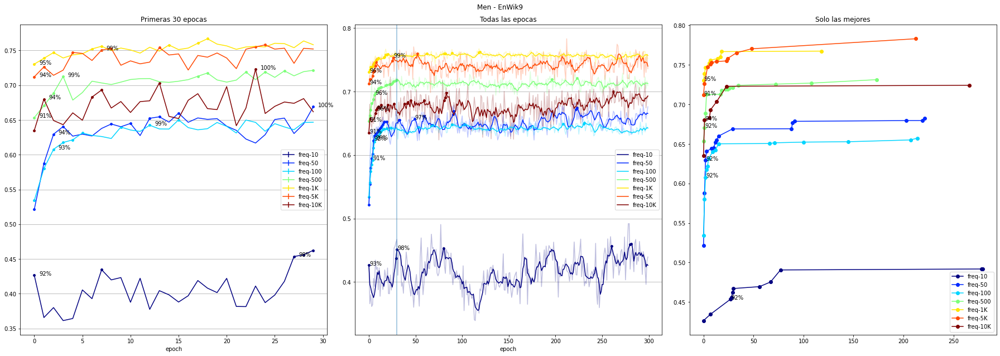

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


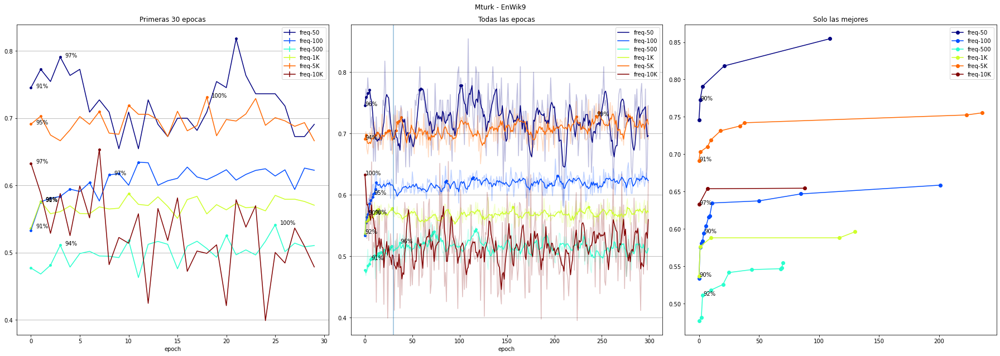

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  

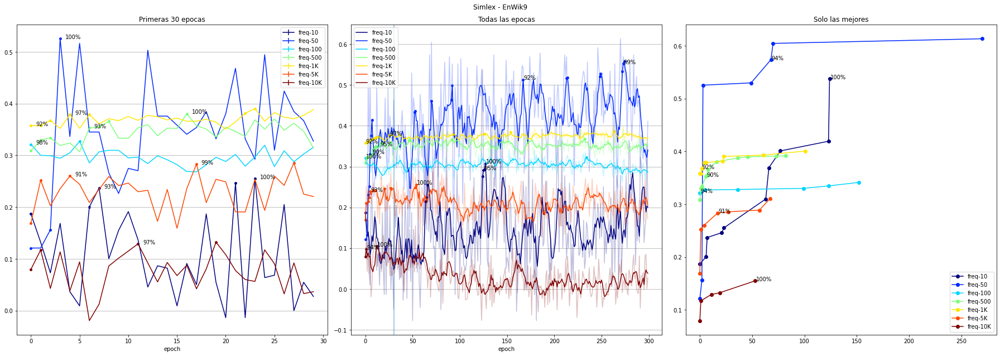

/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/usr/lib/python3.9/site-packages/matplotlib/axes/_base.py:2475: UserWarning: Warning: converting a masked element to nan.
  

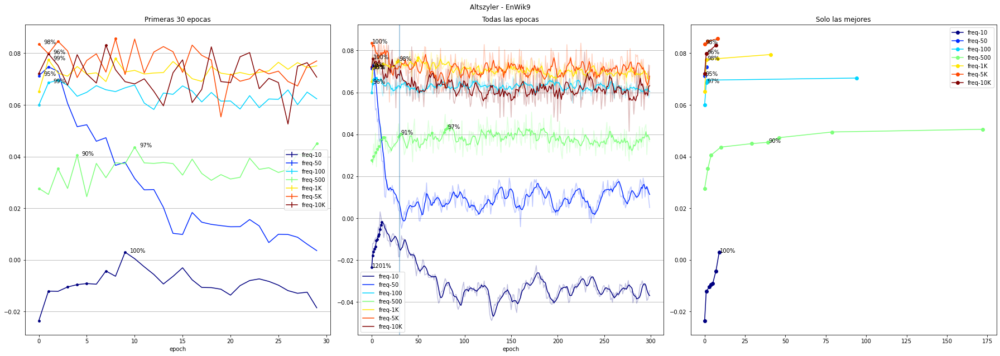

In [37]:
figsize=(25, 9)
for corpus, corpus_config in corpora.items():
    name = corpus_config['name']
    show_header(corpus_config['name'], level=3)
    
    show_header('Rare-Word', level=4, center=True)
    plot_analysis(freq_rw_by_dataset[corpus], f'Rare Word - {name}', cmap=CMAP, figsize=figsize)
    plt.savefig(images_root/f'{corpus}_freq_rareword.png')
    plt.show()
    plt.close()
    
    show_header('Word-Sim', level=4, center=True)
    plot_analysis(freq_ws_by_dataset[corpus], f'Word Sim - {name}', cmap=CMAP, figsize=figsize)
    plt.savefig(images_root/f'{corpus}_freq_wordsim.png')
    plt.show()
    plt.close()
    
    #show_header('Word-Analogy', level=4, center=True); plot_analysis(freq_wa_by_dataset[corpus], f'Word Analogy - {name}', cmap=CMAP, figsize=figsize); plt.show()
    show_header('Men', level=4, center=True)
    plot_analysis(freq_men_by_dataset[corpus], f'Men - {name}', cmap=CMAP, figsize=figsize)
    plt.savefig(images_root/f'{corpus}_freq_men.png')
    plt.show()
    plt.close()
    
    show_header('MTurk', level=4, center=True)
    plot_analysis(freq_mturk_by_dataset[corpus], f'Mturk - {name}', cmap=CMAP, figsize=figsize)
    plt.savefig(images_root/f'{corpus}_freq_mturk.png')
    plt.show()
    plt.close()
    
    show_header('Simlex', level=4, center=True)
    plot_analysis(freq_simlex_by_dataset[corpus], f'Simlex - {name}', cmap=CMAP, figsize=figsize)
    plt.savefig(images_root/f'{corpus}_freq_simlex.png')
    plt.show()
    plt.close()
    
    show_header('Altszyler', level=4, center=True)
    plot_analysis(freq_altszyler_by_dataset[corpus], f'Altszyler - {name}', cmap=CMAP, figsize=figsize)
    plt.savefig(images_root/f'{corpus}_freq_altszyler.png')
    plt.show()
    plt.close()

### Low-Mid-High

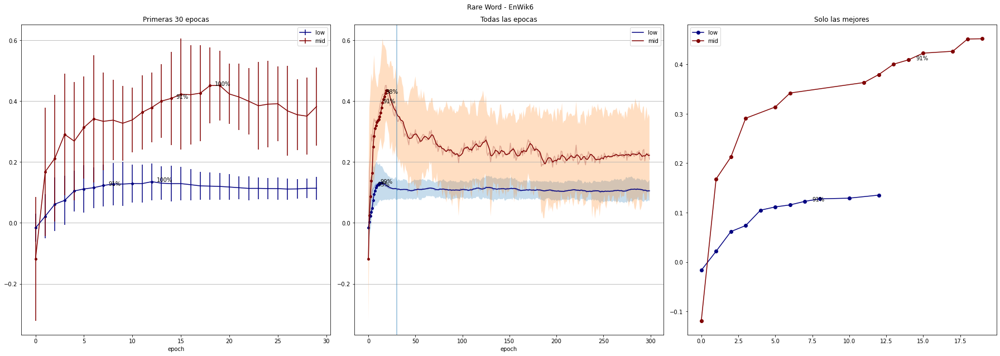

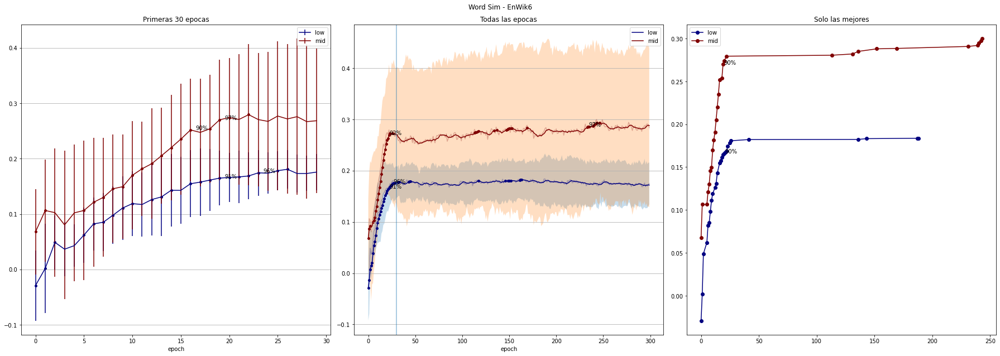

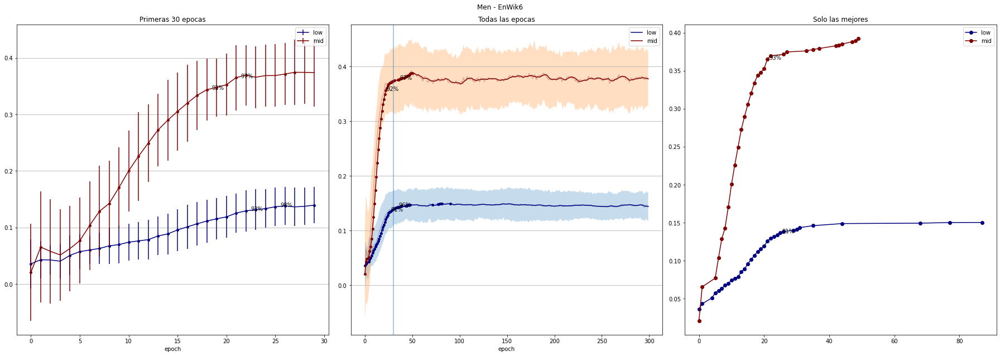

In [38]:
for corpus, corpus_config in corpora.items():
    name = corpus_config['name']
    show_header(corpus_config['name'], level=3)
    show_header('Rare-Word', level=4, center=True); plot_analysis(lmh_rw_by_dataset[corpus], f'Rare Word - {name}', cmap=CMAP); plt.show()
    show_header('Word-Sim', level=4, center=True); plot_analysis(lmh_ws_by_dataset[corpus], f'Word Sim - {name}', cmap=CMAP); plt.show()
    #show_header('Word-Analogy', level=4, center=True); plot_analysis(lmh_wa_by_dataset[corpus], f'Word Analogy - {name}', cmap=CMAP); plt.show()
    show_header('Men', level=4, center=True); plot_analysis(lmh_men_by_dataset[corpus], f'Men - {name}', cmap=CMAP); plt.show()
    show_header('MTurk', level=4, center=True); plot_analysis(lmh_mturk_by_dataset[corpus], f'Mturk - {name}', cmap=CMAP); plt.show()
    show_header('Simlex', level=4, center=True); plot_analysis(lmh_simlex_by_dataset[corpus], f'Simlex - {name}', cmap=CMAP); plt.show()
    show_header('Altszyler', level=4, center=True); plot_analysis(lmh_altszyler_by_dataset[corpus], f'Altszyler - {name}', cmap=CMAP); plt.show()